First, there will be many functions and some data processing.
Just scroll down until you hit a big title.

The story starts with model interpretation.

Pretty much everything here is available in the report in an improved version, so you could also skip it here.

In [1]:
import warnings
warnings.filterwarnings('ignore')

In [2]:
import pandas as pd
import holidays
import itertools
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.compose import make_column_transformer
import matplotlib.pyplot as plt
from sktime.performance_metrics.forecasting import make_forecasting_scorer
import numpy as np
from imblearn.over_sampling import SMOTEN
from sktime.forecasting.tbats import TBATS
import seaborn as sns

In [3]:


pd.set_option('display.max_columns', None)

%matplotlib inline

data = pd.read_csv("sickness_table.csv")
data.drop(data.columns[0], axis = 1, inplace = True)

data["date"] = pd.to_datetime(data["date"])
#data.set_index("date", inplace = True)

data["sby_required"] = data["sby_need"] > 0
data["day_of_month"] = data["date"].dt.day
data["weekday"] = data["date"].dt.day_of_week
data["weekday_name"] = data["date"].dt.day_name()
data["month"] = data["date"].dt.month
data["month_name"] = data["date"].dt.month_name()
data["year"] = data["date"].dt.year
data["is_weekend"] = (data["weekday_name"] == "Saturday") | (data["weekday_name"] == "Sunday")

# create column indicating public holidays
holidays_berlin = holidays.DE(subdiv = "BE", years = [2016, 2017, 2018, 2019])

#initiate column
data["is_holiday"] = False

#set true if date is holiday
for index in range(len(data["date"])):
    if data.loc[index, "date"] in holidays_berlin:
        data.loc[index, "is_holiday"] = True

#crate column indicating school holidays
holidays_school = []
holidays_school.append(pd.date_range("2016-04-01", periods = 1)) #Osterferien
holidays_school.append(pd.date_range("2016-05-06", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2016-05-17", periods = 2)) #Pfingstferien
holidays_school.append(pd.date_range("2016-07-21", periods = 2)) #Sommerferien
holidays_school.append(pd.date_range("2016-07-25", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-01", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-01", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-08", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-15", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-22", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-08-29", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2016-10-17", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2016-10-24", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2016-12-23", periods = 1)) #Weihnachtsferien
holidays_school.append(pd.date_range("2016-12-27", periods = 4)) #Weihnachtsferien
holidays_school.append(pd.date_range("2017-01-02", periods = 2)) #Weihnachtsferien
holidays_school.append(pd.date_range("2017-01-30", periods = 5)) #Winterferien
holidays_school.append(pd.date_range("2017-04-10", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2017-04-18", periods = 1)) #Osterferien
holidays_school.append(pd.date_range("2017-05-24", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2017-05-26", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2017-06-06", periods = 4)) #Pfingstferien
holidays_school.append(pd.date_range("2017-07-20", periods = 1)) #Sommerferien
holidays_school.append(pd.date_range("2017-07-24", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-07-31", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-01", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-07", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-14", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-21", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-08-28", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2017-10-02", periods = 1)) #Herbstferien
holidays_school.append(pd.date_range("2017-10-23", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2017-10-30", periods = 1)) #Herbstferien
holidays_school.append(pd.date_range("2017-11-01", periods = 3)) #Herbstferien
holidays_school.append(pd.date_range("2017-12-21", periods = 2)) #Weihnachtsferien
holidays_school.append(pd.date_range("2017-12-27", periods = 3)) #Weihnachtsferien
holidays_school.append(pd.date_range("2018-01-02", periods = 1)) #Weihnachtsferien
holidays_school.append(pd.date_range("2018-02-05", periods = 5)) #Winterferien
holidays_school.append(pd.date_range("2018-03-26", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2018-04-06", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2018-04-30", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2018-05-11", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2018-05-22", periods = 1)) #Pfingstferien
holidays_school.append(pd.date_range("2018-07-05", periods = 2)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-09", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-16", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-23", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-07-30", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-08-06", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-08-13", periods = 5)) #Sommerferien
holidays_school.append(pd.date_range("2018-10-22", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2018-10-29", periods = 5)) #Herbstferien
holidays_school.append(pd.date_range("2018-12-24", periods = 1)) #Weihnachtsferien
holidays_school.append(pd.date_range("2018-12-31", periods = 5)) #Weihnachtsferien
holidays_school.append(pd.date_range("2019-02-04", periods = 5)) #Winterferien
holidays_school.append(pd.date_range("2019-04-15", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2019-04-23", periods = 4)) #Osterferien
holidays_school.append(pd.date_range("2019-05-31", periods = 1)) #Osterferien

#flatten list
holidays_school = list(itertools.chain(*holidays_school))

data["is_school_holiday"] = False

#set true if date is holiday
for index in range(len(data["date"])):
    if data.loc[index, "date"] in holidays_school:
        data.loc[index, "is_school_holiday"] = True

data["kids_out_of_school"] = data["is_school_holiday"] | data["is_holiday"]

# quarter feature
#data["quarter"] = 1
#data.loc[(data["month"] > 3) & (data["month"] < 7), "quarter"] = 2
#data.loc[(data["month"] > 6) & (data["month"] < 10), "quarter"] = 3
#data.loc[data["month"] > 9, "quarter"] = 4

# season feature
data["season"] = "winter"
data.loc[(data["month"] >= 3) & (data["month"] <= 5), "season"] = "spring"
data.loc[(data["month"] >= 6) & (data["month"] <= 8), "season"] = "summer"
data.loc[(data["month"] >= 9) & (data["month"] <= 11), "season"] = "fall"


# week of the month count feature
data["week_num"] = 1
data.loc[(data["day_of_month"] > 7) & (data["day_of_month"] < 15), "week_num"] = 2
data.loc[(data["day_of_month"] > 14) & (data["day_of_month"] < 22), "week_num"] = 3
data.loc[(data["day_of_month"] > 21) & (data["day_of_month"] < 29), "week_num"] = 4
data.loc[data["day_of_month"] > 28, "week_num"] = 5

#print(data["day_of_month"].dtype)

#add the "unique_id" column for statsforecast regressors
data["unique_id"] = "sby_need"

# rename for statsforecast input df format
data.rename({"date": "ds", "sby_need": "y"}, axis = 1, inplace=True)



data

,ds,n_sick,calls,n_duty,n_sby,y,dafted,sby_required,day_of_month,weekday,weekday_name,month,month_name,year,is_weekend,is_holiday,is_school_holiday,kids_out_of_school,season,week_num,unique_id
0,2016-04-01,73,8154.0,1700,90,4.0,0.0,True,1,4,Friday,4,April,2016,False,False,True,True,spring,1,sby_need
1,2016-04-02,64,8526.0,1700,90,70.0,0.0,True,2,5,Saturday,4,April,2016,True,False,False,False,spring,1,sby_need
2,2016-04-03,68,8088.0,1700,90,0.0,0.0,False,3,6,Sunday,4,April,2016,True,False,False,False,spring,1,sby_need
3,2016-04-04,71,7044.0,1700,90,0.0,0.0,False,4,0,Monday,4,April,2016,False,False,False,False,spring,1,sby_need
4,2016-04-05,63,7236.0,1700,90,0.0,0.0,False,5,1,Tuesday,4,April,2016,False,False,False,False,spring,1,sby_need
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1147,2019-05-23,86,8544.0,1900,90,0.0,0.0,False,23,3,Thursday,5,May,2019,False,False,False,False,spring,4,sby_need
1148,2019-05-24,81,8814.0,1900,90,0.0,0.0,False,24,4,Friday,5,May,2019,False,False,False,False,spring,4,sby_need
1149,2019-05-25,76,9846.0,1900,90,146.0,56.0,True,25,5,Saturday,5,May,2019,True,False,False,False,spring,4,sby_need
1150,2019-05-26,83,9882.0,1900,90,160.0,70.0,True,26,6,Sunday,5,May,2019,True,False,False,False,spring,4,sby_need


In [4]:
def interpretable_scores(y_true, y_pred, debug_printing = False):
    """ 
        
    Score function based on the business goals.
    
    inputs have to be np arrays.
    
    calculates two losses based on the business goals.
    
    first goal: 
    loss is the percent difference in activated sby drivers
    
    values over 100 % drivers activated need to be capped to 100% or penalized.
    otherwise, underpredicting would be beneficial.
    
    first, I calculate a loss_1 where I decided to cap the value for the percentage of activated drivers to 100.
    thereby, the magnitude of underpredicting will not be penalized. 
    instead, the loss is the literal efficiency of sby driver activation.
    importantly, this will give you a positive loss in the following example:
    true: 100, benchmark: 90, pred: 110.
    both the benchmark and the pred are off by 10, 
    but you've lost efficiency by overpredicting!
    
   
    second goal:
    count delta of number of occasions on which additional sby drivers 
    have to be recruited.
    
    furthermore, the magnitude of underpredictions is calculated to judge whether
    the model under investigation is getting closer to the true value when underpredicting 
    than the baseline. 

    """
    import math
    
        
    #################
    # 1. goal
    #################
    
    # compare the mean percentage of sby drivers being activated.
    benchmark_sby_activated = (1 - (90 - y_true) / 90) * 100
    pred_sby_activated = np.where(y_pred!=0,  (1 - (y_pred - y_true) / y_pred) * 100, 100)
    
    if debug_printing == True:
        print("1st goal: efficiency of sby driver activation")
        print(f"benchmark_sby_activated: {benchmark_sby_activated}")
        print(f"pred_sby_activated: {pred_sby_activated}")
        
    #cap the % activation to 100.
    benchmark_sby_activated[benchmark_sby_activated > 100] = 100
    pred_sby_activated[pred_sby_activated > 100] = 100
    
    if debug_printing == True:
        print("after capping:")
        print(f"benchmark_sby_activated: {benchmark_sby_activated}")
        print(f"pred_sby_activated: {pred_sby_activated}")
    
    #unpenalized efficiency score
    avg_benchmark_sby_activated = np.mean(benchmark_sby_activated)
    avg_pred_sby_activated = np.mean(pred_sby_activated)  
    
    # if the difference is < 0 we are meeting business goals
    loss_1 = avg_benchmark_sby_activated - avg_pred_sby_activated

    if debug_printing == True:
        print("averages:")
        print(f"benchmark_sby_activated: {avg_benchmark_sby_activated}")
        print(f"pred_sby_activated: {avg_pred_sby_activated}")
        print(f"On average, the prediction is {loss_1} % less efficient.")

    #################
    # 2. goal
    #################
    
    num_times_benchmark_undershoots = np.count_nonzero(y_true > 90)
    num_times_pred_undershoots = np.count_nonzero(y_true > y_pred)

    # if the difference is y < we are meeting business goals
    loss_2 = num_times_pred_undershoots - num_times_benchmark_undershoots
        
    if debug_printing == True:
        print("\n2nd goal: number of times undershooting")
        print(f"num_times_benchmark_undershoots: {num_times_benchmark_undershoots}")
        print(f"num_times_pred_undershoots: {num_times_pred_undershoots}") 
        print(f"Your predictions undershoot {loss_2} times more often.")
        
    #2. goal: the average magnitude of undershooting, 
    # i.e., the average gap between the preds and the trues
    benchmark_gaps = y_true - 90
    y_pred_gaps = y_true - y_pred
    
    if debug_printing == True:
        print("\n2nd goal: avg number additional drivers required when undershooting")
        print(f"benchmark_gaps: {benchmark_gaps}")
        print(f"y_pred_gaps: {y_pred_gaps}") 
    
    #filter the negative values
    benchmark_gaps = [x for x in benchmark_gaps if x > 0]
    y_pred_gaps = [x for x in y_pred_gaps if x > 0]
    
    if debug_printing == True:
        print("after filtering out values <= 0")
        print(f"benchmark_gaps: {benchmark_gaps}")
        print(f"y_pred_gaps: {y_pred_gaps}") 
    
    #average gap sizes
    avg_benchmark_gaps = np.mean(benchmark_gaps)
    avg_pred_gaps = np.mean(y_pred_gaps) 
    
    # the avg can be nan if there no values,
    # so they're set to 0 here
    if math.isnan(avg_benchmark_gaps):
        avg_benchmark_gaps = 0
    if math.isnan(avg_pred_gaps):
        avg_pred_gaps = 0
    
    #delta: lower is better
    loss_3 = avg_pred_gaps - avg_benchmark_gaps 
            
    if debug_printing == True:
        print(f"avg_benchmark_gaps: {avg_benchmark_gaps}")
        print(f"avg_pred_gaps: {avg_pred_gaps}")
        print(f"On average, {loss_3} additional drivers have to be recruited compared to benchmark when underpredicting.\n")
        
    return loss_1, loss_2, loss_3



In [5]:
year_split = {"first": {"last_train_day": "2018-05-15",
                   "first_test_day": "2018-06-01",
                   "last_test_day": "2018-06-30",
                   "month": "June"},
              
                "second": {"last_train_day": "2018-06-15",
                   "first_test_day": "2018-07-01",
                   "last_test_day": "2018-07-31",
                   "month": "July"},
              
                "third": {"last_train_day": "2018-07-15",
                   "first_test_day": "2018-08-01",
                   "last_test_day": "2018-08-31",
                   "month": "August"},
              
                "fourth": {"last_train_day": "2018-08-15",
                   "first_test_day": "2018-09-01",
                   "last_test_day": "2018-09-30",
                   "month": "September"},
              
                "fifth": {"last_train_day": "2018-09-15",
                   "first_test_day": "2018-10-01",
                   "last_test_day": "2018-10-31",
                   "month": "October"},
              
                "sixth": {"last_train_day": "2018-10-15",
                   "first_test_day": "2018-11-01",
                   "last_test_day": "2018-11-30",
                   "month": "November"},
              
                "seventh": {"last_train_day": "2018-11-15",
                   "first_test_day": "2018-12-01",
                   "last_test_day": "2018-12-31",
                   "month": "December"},
              
                "eighth": {"last_train_day": "2018-12-15",
                   "first_test_day": "2019-01-01",
                   "last_test_day": "2019-01-31",
                   "month": "January"},              
    
                "nineth": {"last_train_day": "2019-01-15",
                   "first_test_day": "2019-02-01",
                   "last_test_day": "2019-02-28",
                   "month": "February"},
          
                 "tenth": {"last_train_day": "2019-02-15",
                   "first_test_day": "2019-03-01",
                   "last_test_day": "2019-03-31",
                   "month": "March"},
          
                 "eleventh": {"last_train_day": "2019-03-15",
                   "first_test_day": "2019-04-01",
                   "last_test_day": "2019-04-30",
                  "month": "April"},
          
                 "twelvth": {"last_train_day": "2019-04-15",
                   "first_test_day": "2019-05-01",
                   "last_test_day": "2019-05-27",
                   "month": "May"}
         }


In [6]:
def calc_confusion(y_true, y_pred):
    
    df = pd.DataFrame({"true": y_true, "pred": y_pred})
    
    TP = len(df[(df["true"] == 1) & (df["pred"] == 1)])
    TN = len(df[(df["true"] == 0) & (df["pred"] == 0)])
    FP = len(df[(df["true"] == 0) & (df["pred"] == 1)])
    FN = len(df[(df["true"] == 1) & (df["pred"] == 0)])
    
    if TP + FN == 0:
        TRP = 0
    else:
        TRP = TP / (TP + FN)
        
    if TN + FP == 0:
        TNR = 0
    else:
        TNR = TN / (TN + FP)
    
    if TP + FP == 0:
        prec = 0
    else:
        prec = TP / (TP + FP)
    
    return TP, FP, TN, FN, TRP, TNR, prec
    
#calc_confusion(np.array([0, 0, 1, 1]), np.array([0,1,0,1]))

In [7]:
def cv_ebm_class_one_year(statsforecast_df, splits_dict, custom_scorer, plotting = True, 
                          outer_bags = 8, inner_bags = 0, max_bins = 256, early_stopping_rounds = 50,
                          early_stopping_tolerance = 0.0001, max_leaves = 3, interactions = 10,
                          max_interaction_bins = 32,
                          oversampler = "None", decision_thr = 0.2,
                         print_mean = True, print_per_month = False):
    """
    function to perform cv for a given model
    
    
    """
    from interpret.glassbox import ExplainableBoostingClassifier

    
    #init lists to append probas and classifiers for single months 
    train_proba_list = []
    train_pred_list = [] # binary prediction based on decision thr 
    train_TPs = []
    train_FPs = []
    train_TNs = []
    train_FNs = []
    train_TPRs = []
    train_TNRs = []
    train_precisions = []
    
    test_proba_list = []
    test_pred_list = [] # binary prediction based on decision thr 
    test_TPs = []
    test_FPs = []
    test_TNs = []
    test_FNs = []
    test_TPRs = []
    test_TNRs = []
    test_precisions = []
    
    classifiers = []
    
    #plotting
    if plotting == True:
        fig, axes = plt.subplots(6, 2, figsize = (60,60))
        # a counter to get the correct ax object
        i = 0
    
    for split in splits_dict.keys(): 
        
        #extract data from the splits_dict for enhanced readability inside the function
        last_train_day = splits_dict[split]["last_train_day"]
        first_test_day = splits_dict[split]["first_test_day"]
        last_test_day = splits_dict[split]["last_test_day"]
        month = splits_dict[split]["month"]

        #classifier dfs
        X_train_clf_df = statsforecast_df[statsforecast_df.ds <= last_train_day].drop(columns = ["ds", "sby_required", 
                                                                                                 "y"])
        Y_train_clf_df = statsforecast_df[statsforecast_df.ds <= last_train_day]["sby_required"]
        X_test_clf_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)].drop(columns = ["ds", "sby_required", 
                                                                                            "y"])
        Y_test_clf_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]["sby_required"]      

        if oversampler == "smote":
            X_train_clf_df, Y_train_clf_df = SMOTE(random_state = 0).fit_resample(X_train_clf_df.astype("int"), Y_train_clf_df.astype("int"))
        elif oversampler == "smoten":
            X_train_clf_df, Y_train_clf_df = SMOTEN(random_state = 0).fit_resample(X_train_clf_df.astype("int"), Y_train_clf_df.astype("int"))
            #print(X_train_clf_df)
        elif oversampler == "adasyn":
            X_train_clf_df, Y_train_clf_df = ADASYN(random_state = 0).fit_resample(X_train_clf_df.astype("int"), Y_train_clf_df.astype("int"))
        elif oversampler == "random":
            X_train_clf_df, Y_train_clf_df = RandomOverSampler(random_state=0).fit_resample(X_train_clf_df.astype("int"), Y_train_clf_df.astype("int"))

        clf = ExplainableBoostingClassifier(random_state=1, 
                                            outer_bags = outer_bags, 
                                            inner_bags = inner_bags, 
                                            max_bins = max_bins, 
                                            early_stopping_tolerance = early_stopping_tolerance, 
                                            max_leaves = max_leaves, 
                                            interactions = interactions,
                                           max_interaction_bins = max_interaction_bins)
        
        clf.fit(X_train_clf_df, Y_train_clf_df)
        classifiers.append(clf)
                
        # get insample predictions   
        train_probas = clf.predict_proba(X=X_train_clf_df)[:,1] #select the probas for class 1
        train_proba_list.append(train_probas)
        train_pred = train_probas > decision_thr
        train_pred_list.append(train_pred)
        
        train_TP, train_FP, train_TN, train_FN, train_TPR, train_TNR, train_prec = calc_confusion(Y_train_clf_df.values, 
                                                                                                 train_pred)
        
        train_TPs.append(train_TP)
        train_FPs.append(train_FP)
        train_TNs.append(train_TN)
        train_FNs.append(train_FN)
        train_TPRs.append(train_TPR)
        train_TNRs.append(train_TNR)
        train_precisions.append(train_prec)
        
        # get test predictions
        test_probas = clf.predict_proba(X=X_test_clf_df)[:,1] #select the probas for class 1
        test_proba_list.append(test_probas)
        test_pred = test_probas > decision_thr
        test_pred_list.append(test_pred)
        
        test_TP, test_FP, test_TN, test_FN, test_TPR, test_TNR, test_prec = calc_confusion(Y_test_clf_df.values, 
                                                                                                 test_pred)
        
        test_TPs.append(test_TP)
        test_FPs.append(test_FP)
        test_TNs.append(test_TN)
        test_FNs.append(test_FN)
        test_TPRs.append(test_TPR)
        test_TNRs.append(test_TNR)
        test_precisions.append(test_prec)
        
        if print_per_month:
            print(f"\n\nmonth {month}\n\n")
            print(f"train_TPR: {train_TPR}")
            print(f"train_TNR: {train_TNR}")
            print(f"train_prec: {train_prec}")
            print(f"\ntest_TPR: {test_TPR}")
            print(f"test_TNR: {test_TNR}")
            print(f"test_prec: {test_prec}")
        
        if plotting == True:
        # plotting
            ax = axes.flat[i]
    
            ax.plot(Y_test_clf_df.index, Y_test_clf_df, label = "sby_req")
            ax.plot(Y_test_clf_df.index, test_probas, label = "probas")
            ax.set_title(month, size = 20)    
            ax.set_ylabel("sby are required", size = 20, labelpad = 20)
            ax.tick_params(axis = "x", rotation = 45)  
            ax.legend()
    
            # iterate the counter for the ax object
            i += 1

    if print_mean:
            print(f"\nmean train_TPR: {np.mean(train_TPRs)}")
            print(f"mean train_TNR: {np.mean(train_TNRs)}")
            print(f"mean train_prec: {np.mean(train_precisions)}")
            print(f"\nmean test_TPR: {np.mean(test_TPRs)}")
            print(f"mean test_TNR: {np.mean(test_TNRs)}")
            print(f"mean test_prec: {np.mean(test_precisions)}")
    
    #https://datagy.io/pandas-dataframe-from-list/
    zipped = list(zip(classifiers, 
                      test_proba_list))

    output_df = pd.DataFrame(zipped, columns = ["classifiers",
                                               "test_proba_list"])
    
    return output_df

In [8]:
def cv_sktime_models_one_year(model, statsforecast_df, splits_dict, custom_scorer, plotting = True,
                     print_per_month = True, print_mean = True, transformer = None, smoothing = None,
                             interval = None):
    """
    function to perform cv for a given model
    
    For some reason, this function always throws the "returning a view versus a copy" warning
    (https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy)
    when rolling windows are calculated or transformers are used.
    I have no clue why they are thrown however, as .loc is used wherever possible.
    the rolling method appears to be correctly implemented as well
    https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.rolling.html
    
    
    """

    from sktime.transformations.series.boxcox import LogTransformer
    from sktime.transformations.series.boxcox import BoxCoxTransformer
    from sktime.forecasting.base import ForecastingHorizon
    
    #init lists to append scores for single months 
    # to calculate average scores for all folds
    efficiency_losses = []
    num_undershoots = []
    magnitude_undershoots = []
    y_pred_list = []
    regressors = []
    
    #plotting
    if plotting == True:
        fig, axes = plt.subplots(6, 2, figsize = (60,60))
        # a counter to get the correct ax object
        i = 0
    
    for split in splits_dict.keys(): 
        
        #extract data from the splits_dict for enhanced readability inside the function
        last_train_day = splits_dict[split]["last_train_day"]
        first_test_day = splits_dict[split]["first_test_day"]
        last_test_day = splits_dict[split]["last_test_day"]
        month = splits_dict[split]["month"]
        leading_days = len(statsforecast_df[(statsforecast_df.ds > last_train_day) &
                                      (statsforecast_df.ds < first_test_day)])
        
        #calculate the length of the forecasting horizon
        horizon = len(statsforecast_df[(statsforecast_df.ds > last_train_day) &
                                      (statsforecast_df.ds <= last_test_day)])  
        
        #extract train and test data
        Y_train_df = statsforecast_df.loc[statsforecast_df.ds <= last_train_day, :]
        Y_test_df = statsforecast_df.loc[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day), :]
        
        #print(Y_train_df)
        
        #smooth the data
        if smoothing == "MA_weekly":
            Y_train_df.loc[:, "y"] = Y_train_df.loc[:, "y",].rolling(window = 7, center = True, closed = "both", min_periods = 1).mean()
        elif smoothing == "MA_monthly":
            Y_train_df.loc[:, "y"] = Y_train_df.loc[:, "y",].rolling(window = 31, center = True, closed = "both", min_periods = 1).mean()
        if smoothing == "MA_oneday":
            Y_train_df.loc[:, "y"] = Y_train_df.loc[:, "y",].rolling(window = 3, center = True, closed = "both", min_periods = 1).mean()
        elif smoothing == "EWM_monthly":
            Y_train_df.loc[:, "y"] = Y_train_df.loc[:, "y",].ewm(span = 30, min_periods = 1).mean()
        elif smoothing == "EWM_weekly":
            Y_train_df.loc[:, "y"] = Y_train_df.loc[:, "y",].ewm(span = 7, min_periods = 1).mean()
            
        #print(Y_train_df)
        
        #transform train data
        if transformer == "ln":
            trafo_obj = LogTransformer(offset = 1)#
            Y_train_transformed = trafo_obj.fit_transform(Y_train_df.loc[:, "y"])
            Y_train_df.loc[:, "y"] = Y_train_transformed
        elif transformer == "boxcox":
            # no offset param available. 
            trafo_obj = BoxCoxTransformer()
            Y_train_transformed = trafo_obj.fit_transform(Y_train_df.loc[:, "y"] + 1)
            Y_train_df.loc[:, "y"] = Y_train_transformed 
                
        
        #fit and predict
        model_obj = model
        model_obj.fit(Y_train_df.loc[:, 'y'].values)
        regressors.append(model_obj)
        
        if interval != None:
            Y_hat_df = pd.DataFrame({"y": model_obj.predict_interval(np.arange(leading_days, horizon), 
                                                                    coverage  = interval)["Coverage"][interval]["upper"]})
        else:
            Y_hat_df = pd.DataFrame({"y": model_obj.predict(np.arange(leading_days, horizon)).reshape(1,-1)[0]})
            # some models make negative predictions, so those should be set to zero
        Y_hat_df[Y_hat_df["y"] < 0] = 0
                
        #transform back
        if transformer == "ln":
            Y_train_rev_transformed = trafo_obj.inverse_transform(Y_train_df.loc[:, "y"] )
            Y_train_df.loc[:, "y"] = Y_train_rev_transformed
            Y_hat_rev_transformed = trafo_obj.inverse_transform(Y_hat_df.loc[:, "y"])
            Y_hat_df.loc[:, "y"] = Y_hat_rev_transformed
            
        elif transformer == "boxcox":
            # as there is no offset available when initializing the 
            # transformer object, you have to manually subtract 1
            Y_train_rev_transformed = trafo_obj.inverse_transform(Y_train_df.loc[:, "y"] ) - 1
            Y_train_df.loc[:, "y"] = Y_train_rev_transformed
            Y_hat_rev_transformed = trafo_obj.inverse_transform(Y_hat_df.loc[:, "y"]) - 1
            Y_hat_df.loc[:, "y"] = Y_hat_rev_transformed
        
        #get arrays of the data for metrics        
        y_trues = Y_test_df.loc[:, 'y'].values
        y_preds = Y_hat_df.loc[:, 'y'].values
        
        #calculate metrics
        efficiency_loss, num_undershoots_loss, magnitude_undershoots_loss = custom_scorer(y_trues, y_preds)
        efficiency_losses.append(efficiency_loss)
        num_undershoots.append(num_undershoots_loss)
        magnitude_undershoots.append(magnitude_undershoots_loss)
        y_pred_list.append(y_preds)

        if plotting == True:
        # plotting
            ax = axes.flat[i]
    
            ax.plot(Y_test_df.ds, y_trues, label = "y")
            ax.plot(Y_test_df.ds, y_preds, label = "y_hat")
            ax.set_title(month, size = 20)    
            ax.set_ylabel("Number of standby drivers", size = 20, labelpad = 20)
            ax.tick_params(axis = "x", rotation = 45)  
            ax.axhline(y = 90, xmin = 0, xmax = 1, color = "red",
                label = "current policy: 90 drivers")
            ax.legend()
    
            # iterate the counter for the ax object
            i += 1
        
        if print_per_month == True:                
            print(f"\nSplit for {month}")
            print(f"Forecasting for {str(horizon - leading_days)} days")
            print(f"Number of leading days: {leading_days}")
            print(f"Loss in efficiency = {efficiency_loss}")
            print(f"Number of additional underpredictions = {num_undershoots_loss}")
            print(f"Number of additional sby drivers required = {magnitude_undershoots_loss}")
    
    if print_mean == True:
        print("\n")
        print(f"Mean efficiency loss per month in percent = {np.mean(efficiency_losses)}")
        print(f"Mean number of additional underpredictions = {np.mean(num_undershoots)}")
        print(f"Mean number of additional sby drivers required = {np.mean(magnitude_undershoots)}")
    
    
    #https://datagy.io/pandas-dataframe-from-list/
    zipped = list(zip(regressors, 
                      y_pred_list,
                     efficiency_losses,
                     num_undershoots,
                     magnitude_undershoots))

    output_df = pd.DataFrame(zipped, columns = ["regressors",
                                                "y_pred_list",
                                                "efficiency_losses",
                                                "num_undershoots",
                                                "magnitude_undershoots"])
    
    return output_df


        

In [9]:
def combine_clf_reg(statsforecast_df, clf_probas, reg_preds, splits_dict, custom_scorer, plotting = True,
                     print_per_month = True, print_mean = True, smoothing = None, decision_thr = 0.2, plot_historical = True):
    """
    function to perform cv for a given statsforecast model
    
    
    """

    #init lists to append scores for single months 
    # to calculate average scores for all folds
    efficiency_losses = []
    num_undershoots = []
    magnitude_undershoots = []
    y_trues_list = []
    y_preds_list = []
    y_uncorr_preds_list = []
    X_tests = []
    y_tests = []
    dates_list = []
    feature_names_list = []
    test_dfs = []

    
    #plotting
    if plotting == True:
        fig, axes = plt.subplots(6, 2, figsize = (60,60))
    
    # a counter to get the correct ax object and month
    i = 0
    
    for split in splits_dict.keys(): 
        
        #print(split)
        
        #extract data from the splits_dict for enhanced readability inside the function
        last_train_day = splits_dict[split]["last_train_day"]
        first_test_day = splits_dict[split]["first_test_day"]
        last_test_day = splits_dict[split]["last_test_day"]
        month = splits_dict[split]["month"]
        
        #extract train and test data
        X_test_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)].drop(columns = ["ds", "sby_required", 
                                                                                            "y",])
        Y_test_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]["y"]
        
        dates = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]["ds"]
        
        test_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]

        
        X_tests.append(X_test_df.values)
        feature_names_list.append(X_test_df.columns.values)
        y_tests.append(Y_test_df.values)
        dates_list.append(dates.values)
        
        
        #calculate the length of the forecasting horizon
        horizon = len(statsforecast_df[(statsforecast_df.ds > last_train_day) &
                                      (statsforecast_df.ds <= last_test_day)])  
        
        #for the preds, you have to get rid of the timepoints 
        #from the last_train_day to the first_test_day, i.e.,
        #the leading period = approximately 15 days, depending on the month
        leading_days = len(statsforecast_df[(statsforecast_df.ds > last_train_day) &
                                      (statsforecast_df.ds < first_test_day)])
        
        
        probas = clf_probas[i]
        probas_bin = (probas >= decision_thr)
        y_hat = reg_preds[i]   
        y_hat_x_probas_bin = y_hat * probas_bin

        y_trues = Y_test_df.values.astype("float64") #manual typing required, otherwise bug in metrics calculations
       
        y_trues_list.append(y_trues)
        y_preds_list.append(y_hat_x_probas_bin)
        y_uncorr_preds_list.append(y_hat)
        
        # insert the probas and preds into test_df for output for later error explainability
        test_df["probas"] = probas
        test_df["y_preds"] = y_hat_x_probas_bin
        test_df["y_trues"] = y_trues # will be float64, thereby wrong types will not create issues later
        test_df["y_preds_uncorr"] = y_hat
        test_dfs.append(test_df)
        
        #calculate metrics
        efficiency_loss, num_undershoots_loss, magnitude_undershoots_loss = custom_scorer(y_trues, y_hat_x_probas_bin)
        efficiency_losses.append(efficiency_loss)
        num_undershoots.append(num_undershoots_loss)
        magnitude_undershoots.append(magnitude_undershoots_loss)
        
        if plotting == True:
        # plotting
            ax = axes.flat[i]    
            ax.plot(dates, y_trues, label = "y", linewidth = "5")
            ax.plot(dates, y_hat_x_probas_bin, label = "y_hat_x_probas_bin", linewidth = "5")
            ax.set_title(month, size = 30)    
            ax.set_ylabel("Number of standby drivers", size = 20, labelpad = 20)
            ax.tick_params(axis = "x", rotation = 45)  
            ax.axhline(y = 90, xmin = 0, xmax = 1, color = "grey",
                label = "current policy: 90 drivers", linewidth = "5")
                    
            if plot_historical == True:
                #get the training data 
                previous_years_months = statsforecast_df[(statsforecast_df.ds <= last_train_day)]
                
                #create features to slice the data
                previous_years_months["day_of_month"] = previous_years_months["ds"].dt.day
                previous_years_months["month_name"] = previous_years_months["ds"].dt.month_name()
                previous_years_months["year"] = previous_years_months["ds"].dt.year
                
                #get data from the same months of the previous years
                previous_years_months = previous_years_months[previous_years_months["month_name"] == month]
                
                for year in previous_years_months.year.unique():
                    y = previous_years_months[previous_years_months["year"] == year].y
                    
                    # in 2019 there are only 27 days in May available,
                    # so I exclude all days later than that in the plot
                    if 2019 in dates.dt.year.unique(): #check if the current year to be plotted is 2019
                        if month == "May":
                            y = y[:27]
                        
                    ax.plot(dates, y.values, linestyle = "--", label = f"y in {year}")
                                
                
            ax.legend()
            
            fig.subplots_adjust(hspace = 0.5)
    
        # iterate the counter for the ax object and month
        i += 1
        
        if print_per_month == True:                
            print(f"\nSplit for {month}")
            print(f"Forecasting for {str(horizon - leading_days)} days")
            print(f"Number of leading days: {leading_days}")
            print(f"Loss in efficiency = {efficiency_loss}")
            print(f"Number of additional underpredictions = {num_undershoots_loss}")
            print(f"Number of additional sby drivers required when underpredicting = {magnitude_undershoots_loss}")
    
    if print_mean == True:
        print("\n")
        print(f"Mean efficiency loss per month in percent = {np.mean(efficiency_losses)}")
        print(f"Mean number of additional underpredictions = {np.mean(num_undershoots)}")
        print(f"Mean number of additional sby drivers required when underpredicting = {np.mean(magnitude_undershoots)}")
    
    
    #https://datagy.io/pandas-dataframe-from-list/
    zipped = list(zip(efficiency_losses, 
                      num_undershoots,
                     magnitude_undershoots,
                     y_trues_list,
                     y_preds_list,
                     y_uncorr_preds_list,
                     X_tests,
                     y_tests,
                     dates_list,
                     feature_names_list,
                     test_dfs))

    output_df = pd.DataFrame(zipped, columns = ["efficiency_losses",
                                                "num_undershoots",
                                                "magnitude_undershoots",
                                                "y_trues_list",
                                                "y_preds_list",
                                                "y_uncorr_preds_list",
                                               "X_tests",
                                               "y_tests",
                                               "dates_list",
                                               "feature_names_list",
                                               "test_df"])

    
    return output_df

In [10]:
def combine_and_eval_clf_reg(statsforecast_df, clf_probas, reg_preds, splits_dict, custom_scorer, plotting = True,
                     print_per_month = True, print_mean = True, smoothing = None, decision_thr = 0.2):
    """
    function to perform cv for a given statsforecast model
    
    
    """

    from matplotlib.pyplot import errorbar
    
    #init lists to append scores for single months 
    # to calculate average scores for all folds
    efficiency_losses = []
    num_undershoots = []
    magnitude_undershoots = []
    y_trues_list = []
    y_preds_list = []
    y_uncorr_preds_list = []
    X_tests = []
    y_tests = []
    dates_list = []
    feature_names_list = []
    test_dfs = []

    
    #plotting
    if plotting == True:
        fig, axes = plt.subplots(12, 5, figsize = (70,140),
                                gridspec_kw = {"width_ratios": [7, 1, 1, 1, 1]})
    
    # a counter to get the correct ax object and month
    i = 0
    
    for j, split in enumerate(splits_dict.keys()): 
        
        #print(split)
        
        #extract data from the splits_dict for enhanced readability inside the function
        last_train_day = splits_dict[split]["last_train_day"]
        first_test_day = splits_dict[split]["first_test_day"]
        last_test_day = splits_dict[split]["last_test_day"]
        month = splits_dict[split]["month"]
        
        #extract train and test data
        X_test_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)].drop(columns = ["ds", "sby_required", 
                                                                                            "y",])
        Y_test_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]["y"]
        
        dates = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]["ds"]
        
        test_df = statsforecast_df[(statsforecast_df.ds >= first_test_day) & 
                                    (statsforecast_df.ds <= last_test_day)]
        
        plot_df = statsforecast_df[statsforecast_df.ds <= last_test_day][["y", "ds"]]
        plot_df["month_name"] = plot_df["ds"].dt.month_name()
        plot_df = plot_df[plot_df.month_name == month]
        plot_df["day_of_month"] = plot_df["ds"].dt.day
        plot_df["year"] = plot_df["ds"].dt.year        

        
        X_tests.append(X_test_df.values)
        feature_names_list.append(X_test_df.columns.values)
        y_tests.append(Y_test_df.values)
        dates_list.append(dates.values)
        
        
        #calculate the length of the forecasting horizon
        horizon = len(statsforecast_df[(statsforecast_df.ds > last_train_day) &
                                      (statsforecast_df.ds <= last_test_day)])  
        
        #for the preds, you have to get rid of the timepoints 
        #from the last_train_day to the first_test_day, i.e.,
        #the leading period = approximately 15 days, depending on the month
        leading_days = len(statsforecast_df[(statsforecast_df.ds > last_train_day) &
                                      (statsforecast_df.ds < first_test_day)])
        
        
        probas = clf_probas[j]
        probas_bin = (probas >= decision_thr)
        y_hat = reg_preds[j]   
        y_hat_x_probas_bin = y_hat * probas_bin

        y_trues = Y_test_df.values.astype("float64") #manual typing required, otherwise bug in metrics calculations
       
        y_trues_list.append(y_trues)
        y_preds_list.append(y_hat_x_probas_bin)
        y_uncorr_preds_list.append(y_hat)
        
        # insert the probas and preds into test_df for output for later error explainability
        test_df["probas"] = probas
        test_df["y_preds"] = y_hat_x_probas_bin
        test_df["y_trues"] = y_trues # will be float64, thereby wrong types will not create issues later
        test_df["y_preds_uncorr"] = y_hat
        test_dfs.append(test_df)
        
        #calculate metrics
        efficiency_loss, num_undershoots_loss, magnitude_undershoots_loss = custom_scorer(y_trues, y_hat_x_probas_bin)
        efficiency_losses.append(efficiency_loss)
        num_undershoots.append(num_undershoots_loss)
        magnitude_undershoots.append(magnitude_undershoots_loss)
        
        if plotting == True:
        # plotting
            ax = axes.flat[i]    
            ax.plot(dates, y_trues, label = "y", linewidth = "5")
            ax.plot(dates, y_hat_x_probas_bin, label = "y_pred", linewidth = "5")
            ax.set_title(month, size = 30, y = 1.01)    
            ax.set_ylabel("Number of standby drivers", size = 20, labelpad = 20)
            ax.tick_params(axis = "x", rotation = 45)  
            ax.axhline(y = 90, xmin = 0, xmax = 1, color = "grey",
                label = "90 drivers", linewidth = "5")                    

            #get the training data 
            previous_years_months = statsforecast_df[(statsforecast_df.ds <= last_train_day)]
                
            #create features to slice the data
            previous_years_months["day_of_month"] = previous_years_months["ds"].dt.day
            previous_years_months["month_name"] = previous_years_months["ds"].dt.month_name()
            previous_years_months["year"] = previous_years_months["ds"].dt.year
                
            #get data from the same months of the previous years
            previous_years_months = previous_years_months[previous_years_months["month_name"] == month]
                
            for year in previous_years_months.year.unique():
                y = previous_years_months[previous_years_months["year"] == year].y
                    
                # in 2019 there are only 27 days in May available,
                # so I exclude all days later than that in the plot
                if 2019 in dates.dt.year.unique(): #check if the current year to be plotted is 2019
                    if month == "May":
                        y = y[:27]
                        
                ax.plot(dates, y.values, linestyle = "--", label = f"y in {year}")
                                
                
            ax.legend(loc = "upper right")
            
            # add a textbox displaying the performance metrics
            # https://matplotlib.org/3.3.4/gallery/recipes/placing_text_boxes.html
            textstr = f"efficiency gain: {- efficiency_loss:.1f} %\nunderpred prevented {- num_undershoots_loss}"
                                
            bbox_props = dict(boxstyle = "round", edgecolor = "black", facecolor = "white")
            ax.text(0.435, 0.94, textstr, transform = ax.transAxes, fontsize = 25,
                     verticalalignment = "top", bbox = bbox_props)
            
            
            # now the plots for the statistics.
            # problem: if you want to exclude zeros
            # you will end up with empty data containers
            # from which no stats can be calculated.
            # to prevent this, I manually construct the x,y values
            # to be plotted here.
            no_zeros_df = plot_df[plot_df.y > 0]
            
            years_to_plot = plot_df.year.unique()
            years_wo_zeros = no_zeros_df.year.unique()
                        
            means = [] 
            medians = []
            std = []
            non_zero_counts = []
            maxs = []
            
            for year in years_to_plot:      
                
                maxs.append(np.max(plot_df[plot_df.year == year].y))
                
                # if the year has non zero values, you can simply calculate the stats
                if year in years_wo_zeros:
                    means.append(np.mean(no_zeros_df[no_zeros_df.year == year].y))
                    medians.append(np.median(no_zeros_df[no_zeros_df.year == year].y))
                    std.append(np.std(no_zeros_df[no_zeros_df.year == year].y))
                    non_zero_counts.append(len(no_zeros_df[no_zeros_df.year == year]))

                    
                else: #set them to zero
                    means.append(0)
                    medians.append(0)
                    std.append(0)
                    non_zero_counts.append(0)
            
            
            # nonzero events
            i += 1
            ax = axes.flat[i]
            
            ax.plot(years_to_plot, non_zero_counts)
            
            ax.set_ylim(bottom = 0)            
            ax.set_title("Count of y > 0", size = 30, y = 1.01)    
            ax.set_ylabel("Counts", size = 20, labelpad = 20)
            ax.set_xticks(years_to_plot, labels = years_to_plot)
            
            # mean value of nonzeros
            i += 1
            ax = axes.flat[i]
            
            ax.errorbar(x = years_to_plot, y = means,
                          yerr = std)
            
            ax.set_ylim(bottom = 0)
            ax.set_title("Mean of y > 0", size = 30, y = 1.01)    
            ax.set_ylabel("Num drivers required", size = 20, labelpad = 20)
            ax.set_xticks(years_to_plot, labels = years_to_plot)
            
            # median
            i += 1
            ax = axes.flat[i]
            
            ax.plot(years_to_plot, medians)
            
            ax.set_ylim(bottom = 0)
            ax.set_title("Median of y > 0", size = 30, y = 1.01)    
            ax.set_ylabel("Num drivers required", size = 20, labelpad = 20)
            ax.set_xticks(years_to_plot, labels = years_to_plot)
            
            
            # max
            i += 1
            ax = axes.flat[i]
            
            ax.plot(years_to_plot, maxs)
            
            ax.set_ylim(bottom = 0)   
            ax.set_title("Max of y", size = 30, y = 1.01)    
            ax.set_ylabel("Num drivers required", size = 20, labelpad = 20)
            ax.set_xticks(years_to_plot, labels = years_to_plot)
    
            # iterate for next month
            i += 1
            
        fig.subplots_adjust(hspace = 0.5)
        sns.despine()
        
        if print_per_month == True:                
            print(f"\nSplit for {month}")
            print(f"Forecasting for {str(horizon - leading_days)} days")
            print(f"Number of leading days: {leading_days}")
            print(f"Loss in efficiency = {efficiency_loss}")
            print(f"Number of additional underpredictions = {num_undershoots_loss}")
            print(f"Number of additional sby drivers required when underpredicting = {magnitude_undershoots_loss}")
    
    if print_mean == True:
        print("\n")
        print(f"Mean efficiency loss per month in percent = {np.mean(efficiency_losses)}")
        print(f"Mean number of additional underpredictions = {np.mean(num_undershoots)}")
        print(f"Mean number of additional sby drivers required when underpredicting = {np.mean(magnitude_undershoots)}")
    
    
    #https://datagy.io/pandas-dataframe-from-list/
    zipped = list(zip(efficiency_losses, 
                      num_undershoots,
                     magnitude_undershoots,
                     y_trues_list,
                     y_preds_list,
                     y_uncorr_preds_list,
                     X_tests,
                     y_tests,
                     dates_list,
                     feature_names_list,
                     test_dfs))

    output_df = pd.DataFrame(zipped, columns = ["efficiency_losses",
                                                "num_undershoots",
                                                "magnitude_undershoots",
                                                "y_trues_list",
                                                "y_preds_list",
                                                "y_uncorr_preds_list",
                                               "X_tests",
                                               "y_tests",
                                               "dates_list",
                                               "feature_names_list",
                                               "test_df"])

    
    return output_df


In [11]:
def plot_granular_perform_per_month(df):
    """
    df is concatenated df resulting from 
    
    """
    fig, axes = plt.subplots(3,4, figsize = (70,25), sharey = False)

    for i, ax in enumerate(axes.flat):

        individual_vals = df[df["month"] == i + 1]
    
        individual_vals["weekday_name_short"] = individual_vals.loc[:, "weekday_name"].map({"Monday": "Mon",
                                                                                "Tuesday": "Tue",
                                                                                "Wednesday": "Wed",
                                                                                "Thursday": "Thu",
                                                                                "Friday": "Fri",
                                                                                "Saturday": "Sat",
                                                                                "Sunday": "Sun"})

        sns.stripplot(x = individual_vals["day_of_month"], 
                  y = - individual_vals["efficiency_loss"],
                  ax = ax, size = 12,
                 hue = individual_vals["additional_underprediction"],
                  palette = {1: "Red", 0: "Black", -1: "Green"},)
    
        ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold", y = 1.01)
        ax.set_xlabel("Days", size = 30, labelpad = 20)
        ax.set_ylabel("Gain in efficiency [%]", size = 30, labelpad = 20)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
        ax.set_xticklabels(individual_vals["weekday_name_short"])
        sns.despine()
        sns.set_theme(font_scale = 2, style = "white")
        ax.set_ylim([-100,100])
        ax.legend(title = "underprediction")

    fig.suptitle("Granular performance comparison per month vs previous policy",
             fontsize = 100, fontweight = "bold", y = 1.01)

    fig.tight_layout(pad = 2.0)


In [12]:
# here the error and MAD. 
# can be used for error assessment of how far off the prediction is.
# lower MAD would be desired even if business metrics are in check!

def plot_granular_error_per_month(df, uncorrected_preds = False):
    
    fig, axes = plt.subplots(3,4, figsize = (70,25), sharey = False)

    cmap = sns.cubehelix_palette(dark=0.25, light=0.75, 
                                 hue = 1, as_cmap=True)
        
    for i, ax in enumerate(axes.flat):

        individual_vals = df[df["month"] == i + 1]
    
        individual_vals["weekday_name_short"] = individual_vals.loc[:, "weekday_name"].map({"Monday": "Mon",
                                                                                "Tuesday": "Tue",
                                                                                "Wednesday": "Wed",
                                                                                "Thursday": "Thu",
                                                                                "Friday": "Fri",
                                                                                "Saturday": "Sat",
                                                                                "Sunday": "Sun"})

        if uncorrected_preds == True:
                sns.stripplot(x = individual_vals["day_of_month"], 
                  y = individual_vals.y_preds_uncorr - individual_vals.y_trues,
                  ax = ax, s = 15,
                 hue = individual_vals["probas"],
                        hue_norm = (0,1),
                  palette = cmap,)
        else:
                sns.stripplot(x = individual_vals["day_of_month"], 
                  y = individual_vals.y_preds - individual_vals.y_trues,
                  ax = ax, s = 15,
                 hue = individual_vals["probas"],
                        hue_norm = (0,1),
                  palette = cmap,)

        ax.get_legend().remove()
        ax.set_title(individual_vals["month_name"].reset_index()["month_name"][1], 
                 size = 40, fontweight = "bold", y = 1.01)
        ax.set_xlabel("Days", size = 30, labelpad = 20)
        ax.set_ylabel("Absolute error", size = 30, labelpad = 20)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
        ax.set_xticklabels(individual_vals["weekday_name_short"])
        ax.axhline(y = 0, xmin = 0, xmax = 1, color = "black", linestyle = "--")
        sns.despine()
        sns.set_theme(font_scale = 2, style = "white")
        
        # https://matplotlib.org/3.3.4/gallery/recipes/placing_text_boxes.html
        mad_pred  = np.mean(np.abs(individual_vals.y_preds - individual_vals.y_trues))
        mad_baseline = np.mean(np.abs(90 - individual_vals.y_trues))
        textstr = f"ΔMAD = {mad_pred - mad_baseline:.1f}\n(pred - baseline) "
        
        bbox_props = dict(boxstyle = "round", edgecolor = "black", facecolor = "white")
        ax.text(0.79, 0.2, textstr, transform = ax.transAxes, fontsize = 25,
                     verticalalignment = "top", bbox = bbox_props)


    #https://stackoverflow.com/questions/62884183/trying-to-add-a-colorbar-to-a-seaborn-scatterplot    
    norm = plt.Normalize(0,1)
    sm = plt.cm.ScalarMappable(cmap = cmap, norm = norm)
    sm.set_array([])
    fig.colorbar(sm, label = "probabilities from classifier")
    
    
    fig.suptitle("Granular absolute error per month",
             fontsize = 100, fontweight = "bold", y = 1.01)

    fig.tight_layout(pad = 2.0)


In [13]:
def plot_data_distr_per_month(all_data_df, prediction_df, kind = "ECDF", 
                              exclude_zeros = True, display_ks = False, 
                              display_performance = True, display_pred = False):
    
    from scipy.stats import ks_2samp
    
    data_df = all_data_df.copy()
    pred_df = prediction_df.copy()
    
    #ensure that both dfs have month, month_name, year columns 
    if "month_name" not in all_data_df.columns:
        print("month_name column is missing in the all_data_df")
    data_df["month"] = data_df["ds"].dt.month
    data_df["month_name"] = data_df["ds"].dt.month_name()
    data_df["year"] = data_df["ds"].dt.year
    
    if "month_name" not in prediction_df.columns:
        print("month_name column is missing in the prediction_df")
    pred_df["month"] = pred_df["ds"].dt.month
    pred_df["month_name"] = pred_df["ds"].dt.month_name()
    pred_df["year"] = pred_df["ds"].dt.year


    fig, axes = plt.subplots(3, 4, figsize = (80,35))
    
    # a counter to get the correct ax object and month
    i = 0
    
    #cmap = sns.dark_palette("#69d", reverse=True, as_cmap=True)
    cmap = {2016: "cornflowerblue",
           2017: "royalblue",
           2018: "darkblue",
           2019: "black"}

    for i, ax in enumerate(axes.flat):
        
               
        #get the year of the prediction and use it to 
        #slice the historical data
        year_of_prediction = pred_df[pred_df["month"] == i + 1].year.unique()[0]

        historical_df = data_df[(data_df["month"] == i + 1) 
                                   & (data_df["year"] <= year_of_prediction)]
        
        month_name = historical_df["month_name"].unique()[0]
        
        #print(f"month_name: {month_name}")
        #print(f"year_of_prediction: {year_of_prediction}")
        #print(f"historical_df: {historical_df}")

        previous_years = historical_df["year"].unique()
        
        #print(f"previous_years: {previous_years}")
        
        #refresh plotting params
        kde_clipping = (0,1000)
        textbox_y = 0.08

            
        # exclude zero values if so desired    
        if exclude_zeros:
            historical_df = historical_df[historical_df.y > 0]
            pred_df = pred_df[pred_df.y_preds > 0]
            
            #for kde plot to exclude 0
            kde_clipping = (1,1000)

            
        if kind == "PDF":
                
            sns.kdeplot(data = historical_df, 
                        x = "y",
                         hue = "year",
                       ax = ax,
                        clip = kde_clipping,
                        palette = cmap,
                        linewidth = 3,
                        )

            sns.rugplot(data = historical_df, 
                        x = "y",
                         hue = "year",
                       ax = ax,
                        height = 0.1,
                        palette = cmap,
                        )
            
            textbox_y += 0.42
                
                
        if kind == "ECDF":            
            sns.ecdfplot(data = historical_df, 
                            x = "y",
                             hue = "year",
                           ax = ax,
                            stat = "count",
                            palette = cmap,
                         linewidth = 3,)
                
                
        if display_pred:
            
            if kind == "ECDF":
                sns.ecdfplot(data = pred_df[pred_df.month_name == month_name], 
                                x = "y_preds",
                               ax = ax,
                             stat = "count",
                            color = "orange",
                             linewidth = 10,)
                
            elif kind == "PDF":
                sns.kdeplot(data = pred_df[pred_df.month_name == month_name], 
                                x = "y_preds",
                               ax = ax,
                            color = "orange",
                            linewidth = 10,)
                    
        ax.set_title(month_name, 
             size = 40, fontweight = "bold", y = 1.01)
        ax.set_xlabel("Drivers needed", size = 30, labelpad = 20)
        
        # increase the width of the most recent year in the plot
        ax.get_lines()[0].set(linewidth = 10)

            
        # start creating text string for the plot
        # https://matplotlib.org/3.3.4/gallery/recipes/placing_text_boxes.html
        textstr = f"year to be predicted: {year_of_prediction}"
        bbox_props = dict(boxstyle = "round", edgecolor = "black", facecolor = "white")
        
        if display_performance:        
            
            # efficiency
            efficiency = - prediction_df[(prediction_df.year == year_of_prediction) & 
                                         (prediction_df.month_name == month_name)]["efficiency_loss"].mean()
            
            
            textstr += f"\navg {efficiency:.0f}% more efficient"
            
            # underpredictions that were prevented by model prediction
            underpredictions = - prediction_df[(prediction_df.year == year_of_prediction) & 
                                         (prediction_df.month_name == month_name)]["additional_underprediction"].sum()
            
            textstr += f"\n{underpredictions:.0f} underprediction(s) prevented"
            
            textbox_y += 0.06
        
        if display_ks:
            
            for year in previous_years:
                #add ks test p values
                if year != year_of_prediction:
                    
                    #skip if one of the years does not have any days where sby drivers were needed
                    if (len(historical_df[historical_df.year == year]) != 0) & (len(
                        historical_df[historical_df.year == year_of_prediction]) != 0):
                
                            ks_result = ks_2samp(historical_df[historical_df.year == year].y, 
                                      historical_df[historical_df.year == year_of_prediction].y)
                
                            #print(f"ks for {month_name} of years {year} and {year_of_prediction}: \n{ks_result}\n")
                        
                            textstr += f"\nks vs {year} p = {ks_result.pvalue:.2f}"
                            
                            textbox_y += 0.03
                            
           
        if kind == "ECDF":
            ax.text(0.73, textbox_y, textstr, transform = ax.transAxes, fontsize = 20,
                verticalalignment = "top", bbox = bbox_props)
            
        elif kind == "PDF":
            ax.text(0.73, textbox_y, textstr, transform = ax.transAxes, fontsize = 20,
                 verticalalignment = "top", bbox = bbox_props)
            
            
        sns.despine()
        sns.set_theme(font_scale = 2, style = "white")          
            
        fig.subplots_adjust(hspace = 0.7)
            
        fig.suptitle(f"{kind} plots of drivers needed per month",
                 fontsize = 100, fontweight = "bold", y = 1.01)

        fig.tight_layout(pad = 2.0)
   


In [14]:
def plot_eff_gain_dow(df):
    
    import seaborn as sns

    fig, axes = plt.subplots(3,4, figsize = (40,40), sharey = True)

    for i, ax in enumerate(axes.flat):

        individual_vals = df[df["month"] == i + 1]

        sns.boxplot(x = individual_vals["weekday_name"], 
                    y = - individual_vals["efficiency_loss"], 
                    fliersize = 0, 
                    order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                    ax = ax, color = "white")
    
        sns.swarmplot(x = individual_vals["weekday_name"], 
                      y = - individual_vals["efficiency_loss"], 
                      order = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"],
                      ax = ax, size = 12,
                      hue = - individual_vals["additional_underprediction"],
                     palette = {-1: "Red", 0: "Black", 1: "Green"},
                     )
        
    
        ax.set_title(individual_vals["month_name"].reset_index().loc[0, "month_name"], 
                     size = 40, fontweight = "bold", y = 1.01)
        ax.set_xlabel("")
        ax.set_ylabel("Gain in efficiency [%]", size = 30, labelpad = 20)
        ax.set_xticklabels(ax.get_xticklabels(), rotation = 45)
        ax.set_ylim([-100, 100])
        sns.despine()
        sns.set_theme(font_scale = 2, style = "white")
        ax.tick_params(axis = "y", reset = True)
        ax.legend(title = "underprediction\nprevented")

    fig.suptitle("Efficiency gain per day of the week",
             fontsize = 100, fontweight = "bold", y = 1.01)
    
    fig.tight_layout(pad = 2.0)


In [15]:
def plot_perform_per_month(df):
    
    fig, ax = plt.subplots(figsize = (35, 20))

    sns.violinplot(x = df["month_name"], 
                y = - df["efficiency_loss"], 
                fliersize = 0, 
                order = ["January", "February", "March", "April", "May", "June",
                        "July", "August", "September", "October", "November", "December"],
                ax = ax,
                color = "white",
                  inner = "quartile")
    
    sns.stripplot(x = df["month_name"], 
                  y = - df["efficiency_loss"],
                  order = ["January", "February", "March", "April", "May", "June",
                        "July", "August", "September", "October", "November", "December"],
                  ax = ax, size = 12, hue = - df["additional_underprediction"],
                     palette = {- 1: "Red", 0: "Black", 1: "Green"},)

    ax.set_xlabel("")
    ax.set_ylabel("Gain in efficiency [%]", size = 50, labelpad = 20)
    plt.yticks(fontsize = 40)
    ax.set_xticklabels(ax.get_xticklabels(), fontsize = 40, rotation = 45)
    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")
    ax.set_ylim([-100,100])
    ax.legend(loc = "lower right", title = "underprediction\nprevented")


    fig.suptitle("Performance comparison per month vs previous policy",
                 fontsize = 60, fontweight = "bold", y = 1.01)
    fig.tight_layout(pad = 2.0)


In [16]:
def calc_efficiency(y_true, y_pred):
    
    import numpy as np
    
    # compare the mean percentage of sby drivers being activated.
    benchmark_sby_activated = (1 - (90 - y_true) / 90) * 100
    pred_sby_activated = np.where(y_pred!=0,  (1 - (y_pred - y_true) / y_pred) * 100, 100)
        
    #cap the % activation to 100.
    benchmark_sby_activated[benchmark_sby_activated > 100] = 100
    pred_sby_activated[pred_sby_activated > 100] = 100
    
    return benchmark_sby_activated - pred_sby_activated

In [17]:
def combine_output_dfs(clf_reg_df):
    
    """
    data wrangler for the output from the combine_clf_reg function 
    to make the data accessible for plotting functions
    """

    combined_dfs = pd.concat([clf_reg_df.loc[i, "test_df"] for i in range(len(clf_reg_df))])

    combined_dfs["efficiency_loss"] = calc_efficiency(combined_dfs.y_trues.values, combined_dfs.y_preds.values)
    combined_dfs["additional_underprediction"] = (combined_dfs.y_preds < combined_dfs.y_trues).astype("int") - (90 < combined_dfs.y_trues).astype("int")

    combined_dfs["day_of_month"] = combined_dfs["ds"].dt.day
    combined_dfs["weekday"] = combined_dfs["ds"].dt.day_of_week
    combined_dfs["weekday_name"] = combined_dfs["ds"].dt.day_name()
    combined_dfs["month"] = combined_dfs["ds"].dt.month
    combined_dfs["month_name"] = combined_dfs["ds"].dt.month_name()
    combined_dfs["year"] = combined_dfs["ds"].dt.year

    return combined_dfs


In [18]:

def plot_stats_per_month(df):
       
    
    fig, axes = plt.subplots(2,1, figsize = (35, 30))

    
    axes.flat[0] = sns.barplot(x = df["month_name"], 
                y = - df["efficiency_loss"],
                estimator = np.mean,
                capsize = 0.1,
                errorbar= None,
                order = ["January", "February", "March", "April", "May", "June",
                        "July", "August", "September", "October", "November", "December"],
                ax = axes.flat[0],
               color = "lightsteelblue", 
                linewidth = 3, edgecolor = "0.5")
    

    axes.flat[0].set_xlabel("")
    axes.flat[0].set_xticklabels(axes.flat[0].get_xticklabels(), rotation = 45, size = 30)
    axes.flat[0].set_yticklabels("")
    axes.flat[0].set_ylabel("Gain in efficiency [%]", size = 40, labelpad = 20)  
    axes.flat[0].axhline(y = 0, xmin = 0, xmax = 1, color = "black", linestyle = "--")
    
    monthly_averaged_effic = - np.mean(df.groupby("month_name").agg("mean")["efficiency_loss"])
    axes.flat[0].axhline(y = monthly_averaged_effic, xmin = 0, xmax = 1, color = "orange", 
                         linestyle = "-", 
                         label = f"Mean Gain: {monthly_averaged_effic:.1f}%")
    axes.flat[0].set_title("Gain in efficiency", fontsize = 60)
    
    axes.flat[0].legend(fontsize = 35, loc = "center")
    for i in axes.flat[0].containers:
        axes.flat[0].bar_label(i, fmt = "% .1f")
    
    #underpredictions prevented
    
    axes.flat[1] = sns.barplot(x = df["month_name"], 
                y = df["additional_underprediction"],
                estimator = np.sum,
                errorbar = None,
                order = ["January", "February", "March", "April", "May", "June",
                        "July", "August", "September", "October", "November", "December"],
                ax = axes.flat[1],
               color = "lightsteelblue", linewidth = 3, edgecolor = "0.5")
    
    axes.flat[1].set_xlabel("")
    axes.flat[1].set_xticklabels(axes.flat[1].get_xticklabels(), rotation = 45, size = 30)
    axes.flat[1].set_yticklabels("")
    axes.flat[1].set_ylabel("Delta num underpredictions", size = 40, labelpad = 20)    
    axes.flat[1].axhline(y = 0, xmin = 0, xmax = 1, color = "black", linestyle = "--")
    axes.flat[1].set_title("Delta num underpredictions", fontsize = 60)
    
    monthly_averaged_unders = - np.mean(df.groupby("month_name").agg("sum")["additional_underprediction"])
    axes.flat[1].axhline(y = - monthly_averaged_unders, xmin = 0, xmax = 1, color = "orange", 
                         linestyle = "-", 
                         label = f"Mean {monthly_averaged_unders:.1f} less underpredictions")
    axes.flat[1].legend(fontsize = 35, loc = "center left")
    for i in axes.flat[1].containers:
        axes.flat[1].bar_label(i,)
    


    sns.despine()
    sns.set_theme(font_scale = 2, style = "white")



    fig.suptitle("Performance comparison per month vs previous policy",
                 fontsize = 70, fontweight = "bold", y = 1.0)
    fig.tight_layout(pad = 2.0)
    




In [19]:
#the oversampler requires numerical categories


num_encoded_df = data[["ds", "y", "sby_required", 
                       "weekday", "day_of_month", 
                       "month", "is_weekend", "kids_out_of_school",
                       "season", "week_num"]]


num_encoded_df.season.replace({"spring" : 1, "summer": 2, "fall": 3, "winter": 4}, inplace = True)

num_encoded_df

,ds,y,sby_required,weekday,day_of_month,month,is_weekend,kids_out_of_school,season,week_num
0,2016-04-01,4.0,True,4,1,4,False,True,1,1
1,2016-04-02,70.0,True,5,2,4,True,False,1,1
2,2016-04-03,0.0,False,6,3,4,True,False,1,1
3,2016-04-04,0.0,False,0,4,4,False,False,1,1
4,2016-04-05,0.0,False,1,5,4,False,False,1,1
...,...,...,...,...,...,...,...,...,...,...
1147,2019-05-23,0.0,False,3,23,5,False,False,1,4
1148,2019-05-24,0.0,False,4,24,5,False,False,1,4
1149,2019-05-25,146.0,True,5,25,5,True,False,1,4
1150,2019-05-26,160.0,True,6,26,5,True,False,1,4


In [20]:
clf_output = cv_ebm_class_one_year(num_encoded_df, year_split, interpretable_scores, decision_thr = 0.15,
                                                   plotting = False, print_per_month = False, print_mean = False,
                                                   oversampler = "smoten",
                                 outer_bags = 8, inner_bags = 8, max_bins = 256, early_stopping_rounds = 50,
                                          early_stopping_tolerance = 0.0001, max_leaves = 5, interactions = 16,)

clf_probas = clf_output["test_proba_list"].to_list()


Split for June
Forecasting for 30 days
Number of leading days: 16
Loss in efficiency = 5.856922067173187
Number of additional underpredictions = -4
Number of additional sby drivers required = -16.439726880043025

Split for July
Forecasting for 31 days
Number of leading days: 15
Loss in efficiency = 13.803691758353935
Number of additional underpredictions = -3
Number of additional sby drivers required = -87.62565690015394

Split for August
Forecasting for 31 days
Number of leading days: 16
Loss in efficiency = 11.529391315884538
Number of additional underpredictions = -6
Number of additional sby drivers required = -55.0

Split for September
Forecasting for 30 days
Number of leading days: 16
Loss in efficiency = 10.495054556012832
Number of additional underpredictions = -4
Number of additional sby drivers required = -21.814063427471368

Split for October
Forecasting for 31 days
Number of leading days: 15
Loss in efficiency = 4.066285786067276
Number of additional underpredictions = -3
N

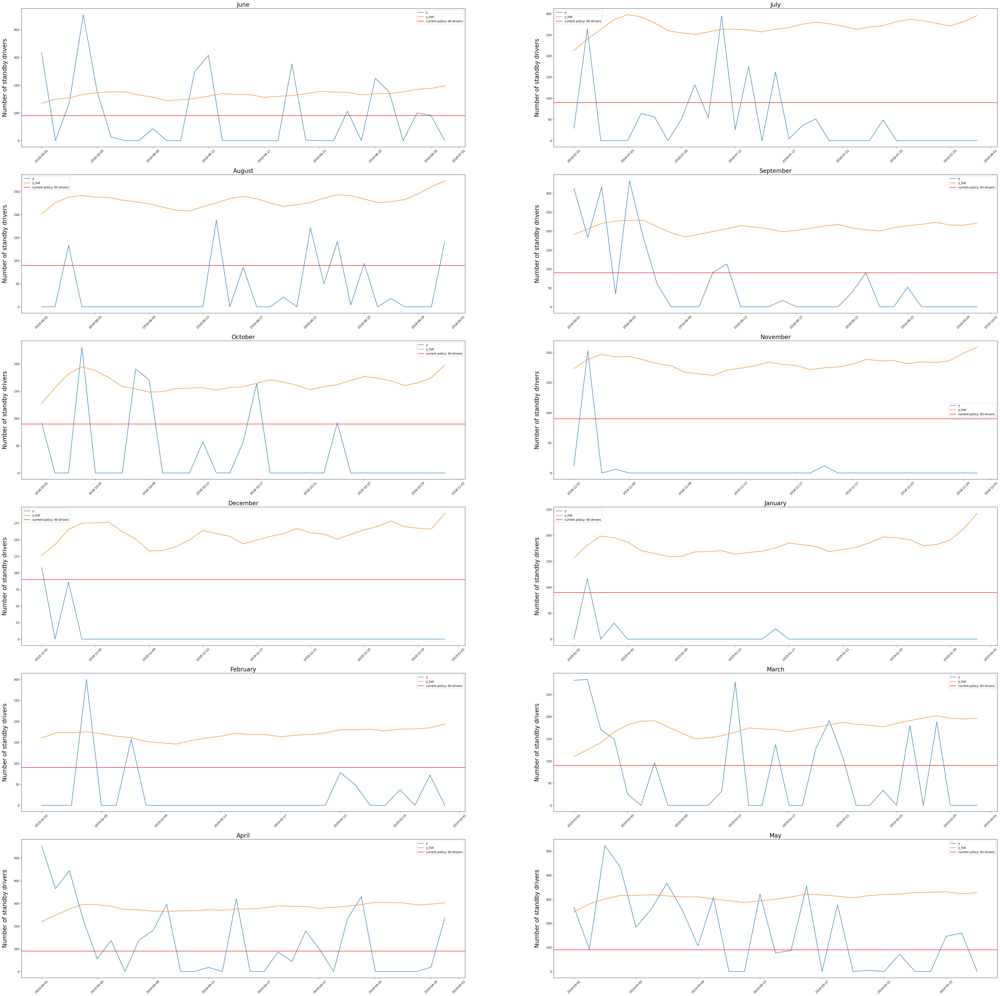

In [21]:
# tbats smoothed interval
# interestingly, the TBATS performs way worse when allowing 
# all TBATS params to be used 
forecaster = TBATS(sp = [365.25, 30.4375, 7],
                  use_box_cox = False,
                  use_trend = False,
                  use_damped_trend = False,
                  use_arma_errors = False,
                  n_jobs = -1)
                    
tbats_data = cv_sktime_models_one_year(model = forecaster, 
         statsforecast_df = data, 
         splits_dict = year_split, 
         custom_scorer = interpretable_scores,
                        transformer = None,
                          smoothing = "MA_oneday",
                         plotting = True, interval = 0.8) 

In [22]:
tbats_preds = tbats_data["y_pred_list"].to_list()

In [23]:
# decision threshold 0.15

combined_df = combine_clf_reg(num_encoded_df, clf_probas, tbats_preds, year_split, interpretable_scores, plotting = False,
                     print_per_month = False, print_mean = False, smoothing = None, decision_thr = 0.15)

In [24]:
combined_dfs = combine_output_dfs(combined_df)

#combined_dfs

## Model interpretation 

In order to make the model interpretable to the client, it makes sense to split the interpretation into two parts, and explain the classifier and regressor seperately.


### EBM classifier

First, the combined model predicts the probability of whether drivers will be required.
This classification is done using Microsoft's Explainable Boosting Classifier.

To explain the predictions globally, we can look at the summary of the feature importances in the following.
Furthermore, individual features can be selected in the widget below to dig deeper into how final probabilities will be build up from individual features' unique values.

"The density is a histogram describing the data distribution for that feature (estimated using any data passed into the explain_* methods). It is often useful to understand how much data is in each region of the feature space when visualizing an explanation – models can perform very differently with large and small samples." - https://interpret.ml/docs/faq.html

Note: The global explaination below has been made for the most recently trained model from the expanding window cv.

In [25]:
from interpret.provider import InlineProvider
from interpret import set_visualize_provider
from interpret import show

set_visualize_provider(InlineProvider())

ebm_clf_global = clf_output.loc[11, "classifiers"].explain_global()
show(ebm_clf_global)

I will elaborate more on the interpretation in the report.


Using interpretML it is also possible to explain predictions locally (see below; I uploaded .pngs in case the widget does not work).

For the local interpretations, the following events will be used:

 - probability of nonzero driver needs is high (rightfully) (index 0 in the widget)
why: May 1st, Wednesday, beginning of the month, hence probability ~ 92 % for class 1, higher than decision threshold --> regressor

- probability of nonzero driver needs is low (rightfully) (index 1 in the widget)
why: May 12th, Sunday, middle of the month, hence, probability ~ 8 % for class 1, lower than decision threshold --> 0 drivers

- probability of nonzero driver needs is low (erroneously) (index 3 in the widget)
why: May 26th, Sunday, end of the month, hence, probability ~ 8 % for class 1, lower than threshold --> 0 drivers. 
The probability of having nonzero driver needs is ~ 8 % in such situations for the classifier, thus it considers this event to be a rather rare one. 

- probability of nonzero driver needs is a coin flip (index 4 in the widget)
why: May 27th, end of the month, but it is a Monday! Hence, probability = 51 % for class 0, higher than decision threshold --> regressor.


"The values shown here are log-odds scores from the EBM, which are added and passed through a logistic-link function to get the final prediction, just like logistic regression" - https://interpret.ml/docs/getting-started.html


In [26]:
ebm = clf_output.loc[11, "classifiers"]
X_explain = num_encoded_df[(num_encoded_df.ds == "2019-05-01") |
                          (num_encoded_df.ds == "2019-05-12") |
                           (num_encoded_df.ds >= "2019-05-25")].loc[:, ["weekday", 
                                                              "day_of_month", 
                                                              "month", 
                                                              "is_weekend", 
                                                              "kids_out_of_school", 
                                                              "season", 
                                                              "week_num"]]

y_explain = num_encoded_df[(num_encoded_df.ds == "2019-05-01") |
                           (num_encoded_df.ds == "2019-05-12") |
                          (num_encoded_df.ds >= "2019-05-25")].sby_required


ebm_local = ebm.explain_local(X_explain, y_explain)
show(ebm_local)

### TBATS

In order to fully understand the regressor, it is required to retrieve its parameters.

In [27]:
tbats_data.loc[11, "regressors"].get_fitted_params()

{'a': None, 'i': None, 'c': None}


Unfortunately, you cannot get the components of the TBATS model when using the sktime wrapper.
Hence, the most recent model was rerun using the original TBATS package with the same input parameters in order to extract the components, at least for the model most recently trained during the expanding window cv.

In [28]:
#https://github.com/intive-DataScience/tbats

from tbats import TBATS as ogTBATS

tbats_train = num_encoded_df[num_encoded_df.ds <= "2019-04-15"]
tbats_train.y = tbats_train.y.rolling(window = 3, center = True, closed = "both", min_periods = 1).mean()


estimator = ogTBATS(seasonal_periods = [365.25, 30.4375, 7],
                   use_arma_errors = False,
                   use_box_cox = False,
                   use_damped_trend = False,
                   use_trend = False)

fitted_model = estimator.fit(tbats_train.y.values)



In [29]:
#https://github.com/intive-DataScience/tbats/blob/master/examples/detailed_tbats.py

# Lets check components used in the model

params = fitted_model.params
components = fitted_model.params.components

print('Smoothing parameter', params.alpha)

print('Seasonal periods',
        components.seasonal_periods)  # TBATS may choose non-seasonal model even if you provide seasons
print('Harmonics amount for each season', components.seasonal_harmonics)
print('1st seasonal smoothing parameters', params.gamma_1())  # one value for each season
print('2nd seasonal smoothing parameters', params.gamma_2())  # one value for each season


Smoothing parameter 1.1404866272382914
Seasonal periods [  7.      30.4375 365.25  ]
Harmonics amount for each season [3 8 1]
1st seasonal smoothing parameters [ 0.00062858 -0.00219344 -0.00198879]
2nd seasonal smoothing parameters [-2.60644476e-06  9.37927155e-04  1.95687431e-03]


These parameters can be plugged into the formulas provided in http://dx.doi.org/10.1198/jasa.2011.tm09771

However, as the complete formula will be very long due to the number fourier terms included, e.g., eight terms for the monthly season, it will, most definitely, not be helpful for the client if I would provide it in the report as such a long formula including all kinds of sine and cosine terms will not be interpretable in any stretch of the imagination.

Instead, I believe that providing a super simple, high level description of how a seasonal exponential smoother would work will make the regressor part most interpretable for the client.


# Performance and error analysis

In the following, a performance and error analysis will be performed. 

First the overall performance of the model was plotted when stratified per month.


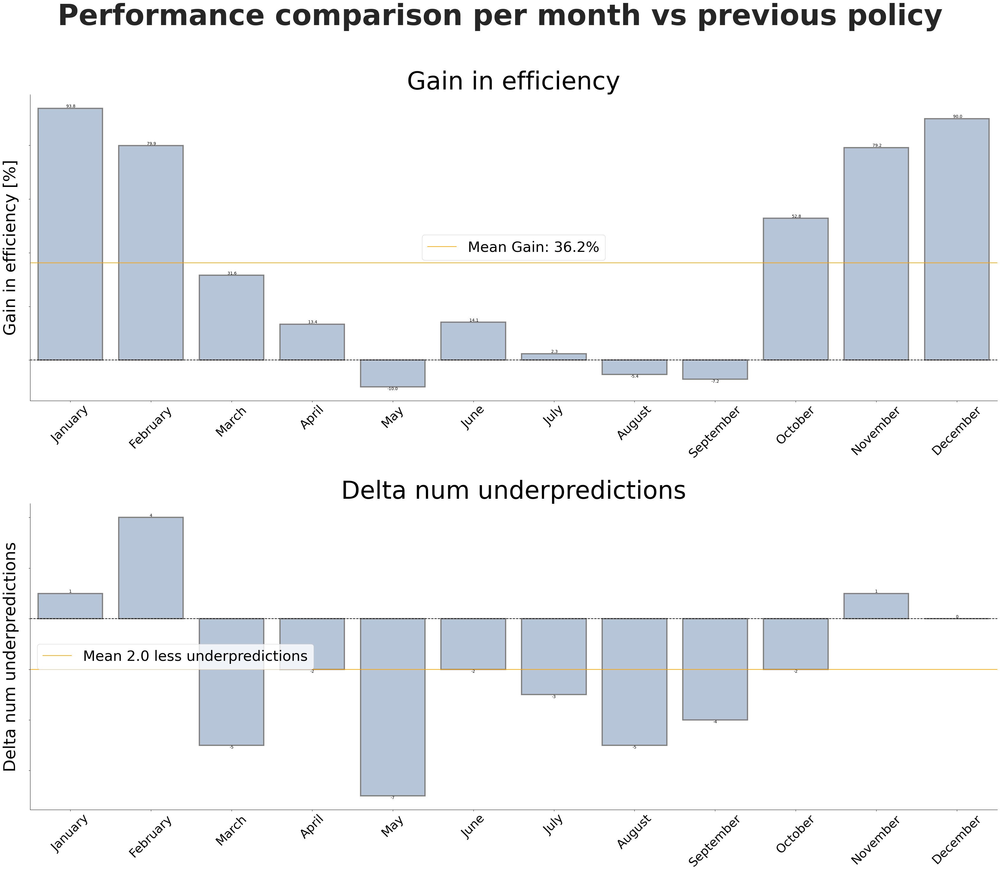

In [30]:
plot_stats_per_month(combined_dfs)

Over the year, the model increases the efficiency by about 36 % while preventing an average of 2 days of underpredictions as compared to the previous policy.
Therefore, it satisfies business goals.

When stratifying the performance per month it becomes obvious that there is a rather high variability in the model's performance over the course of the year.
In general, the gain in efficiency is achieved by increasing the efficiency substantially in the fall/winter months, while the model makes its gains in prevented underpredictions in the remaining months. 

In some months, the high number of prevented underpredictions comes at the cost of a reduced efficiency when compared to the previous policy, such as in May.
However, the reduction in efficiency is only minor, being at max 10 % in May, suggesting that the high number of prevented underpredictions in that month in particular would be worth the sacrifice in efficiency. This seems to be especially true when considering the variation in driver needs in Mays in general which makes predictions very difficult (cf. discussions below).

Notably, the high gain in efficiency over the winter months generally happens without causing a high number of additional underpredictions, with February being the exception, where 4 additional underpredictions occurred. However, as will be discussed below, it seems likely that it was not the fault of the modeling approach per se that lead to these additional underpredictions.

In the following, the performance of the model will be investigated in further detail. 


findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


(<Figure size 3000x1000 with 3 Axes>,
 array([<AxesSubplot:ylabel='2018'>, <AxesSubplot:ylabel='2019'>],
       dtype=object))

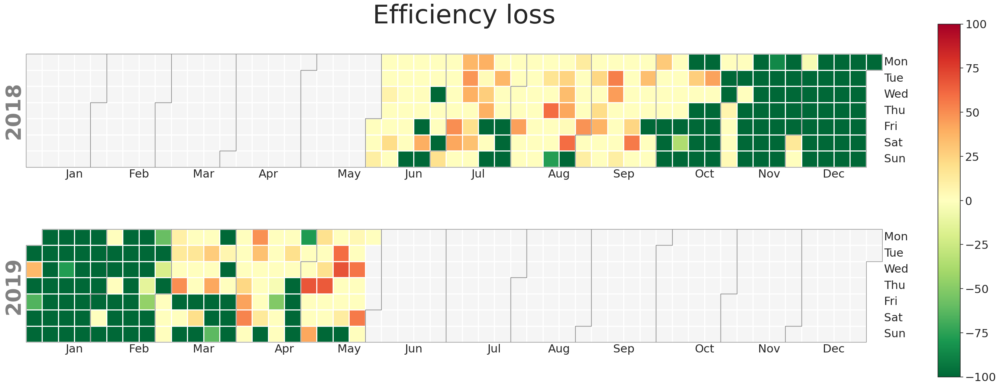

In [31]:
import calplot

calplot.calplot(combined_dfs.set_index("ds")["efficiency_loss"], cmap='RdYlGn_r',
                vmin = -100, vmax = 100,
                suptitle = "Efficiency loss",
                suptitle_kws = {"size":50},
                yearlabel_kws = {"fontsize": 40},
                figsize = (30,10),
                colorbar=True,)

In the plot above, the loss in efficiency is color coded to a grid of years, months and weekdays; the greener the better, the darker red the worse.
This allows for a quick, exploratory glance at where the model performs well, and whether there might be patterns in worse performance, e.g., whether there might be issues at certain parts of the months in several months. 

However, in the figure there is a lot of information which could be conveyed in a more efficient manner, so I will most likely not include it in the report.

Next, model performance was investigated by plotting the absolute error of the predictions over the course of the whole cross-validation period. 



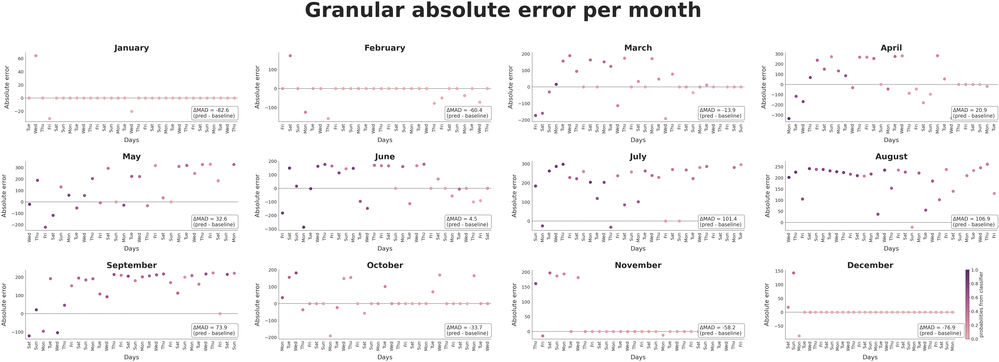

In [32]:
plot_granular_error_per_month(combined_dfs, uncorrected_preds = False)


As can be seen in the plot, the model is overpredicting most of the time which was expected given that predictions were deliberately increased by setting the point predictions to the upper bounds of the 80 % prediction interval to incorporate a safety buffer in standby drivers available for duty. 

Interestingly, sometimes the error is zero, indicating perfect predictions. 
Those perfect predictions are most likely days where the need in drivers was rightfully predicted to be zero, as can be derived from the color coding of the datapoints, as the colors encode the probability for nonzero driver requirements returned from the classifier.
Moreover, the color coding can be used to get general insights of the behavior of the classifier, where it predicts higher probabilities of nonzero driver requirements for summer months, for beginnings of the months as well as for working days.

Lastly, the absolute error of the model's prediction alone does not indicate whether the proposed model performs better or worse than the previous policy.
Thus, the difference in the monthly MADs of the previous policy and the proposed model was calculated and added to the plot to gain insights into when the model might be closer or farther away from the true driver requirements than the previous policy.
In line with the interpretations above, the proposed model is way closer to the true driver requirements during winter months than the previous policy. 
Conversely, as expected, the model's predictions are less precise than the previous policy during the summer month due to the safety buffer.

As the absolute error of the model is secondary to the business metrics, it was investigated where the model makes its gains and losses in the business metrics across time. 

For that matter, the gain in efficiency across time was plotted with datapoints colorcoded with whether they constituted additional underpredictions (-1, red) or prevented them (1, green).



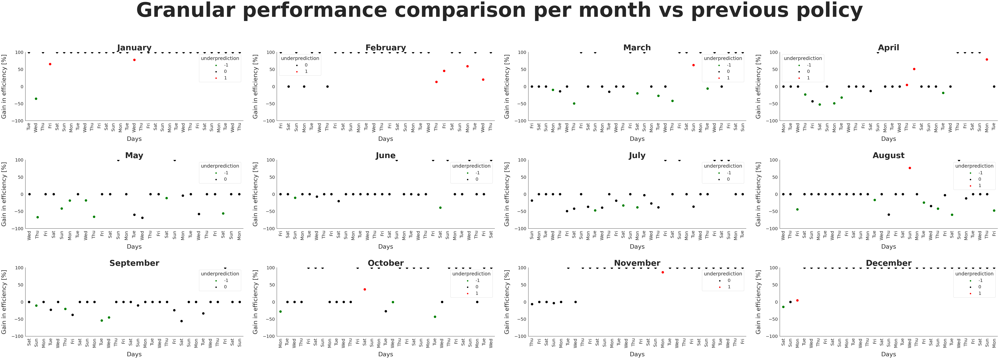

In [33]:
plot_granular_perform_per_month(combined_dfs)


In the plot above, it can be seen that most underpredictions prevented are located at the beginning of the months, where efficiency is usually lost. However, the reduction in efficiency is oftentimes traded for the prevention of an underprediction, which is desired by the client to my current understanding.
 
Conversely, the highest gains in efficiency are usually made in the second half of the months, with the exception being the winter months, where the number of drivers required is predicted to be zero on most of the days, leading to an efficiency gain of 100 % on nearly all days in those months. Similarly, most additional underpredictions occur in the second half of the months as this is the time where the model typically predicts a lower number of drivers. 

Of note, however, the number of additional underpredictions occurring in the second half of the months is usually negligibly  low, with the exception of perhaps February, which will be discussed below.
Further, as seen in the "Performance comparison per month vs previous policy " figure, additional underpredictions occurring are generally well compensated by the number of underpredictions prevented, thus leading to favorable model performance. 

As outlined above, the classifier predicts way higher probabilities for zero-demands in driver needs on the weekends, oftentimes leading to zero-predictions on Sundays even in Months where there is usually a high demand in drivers. 
Therefore, data of each month were aggregated to investigate whether the approach of predicting zero drivers on weekends could lead to additional underpredictions.


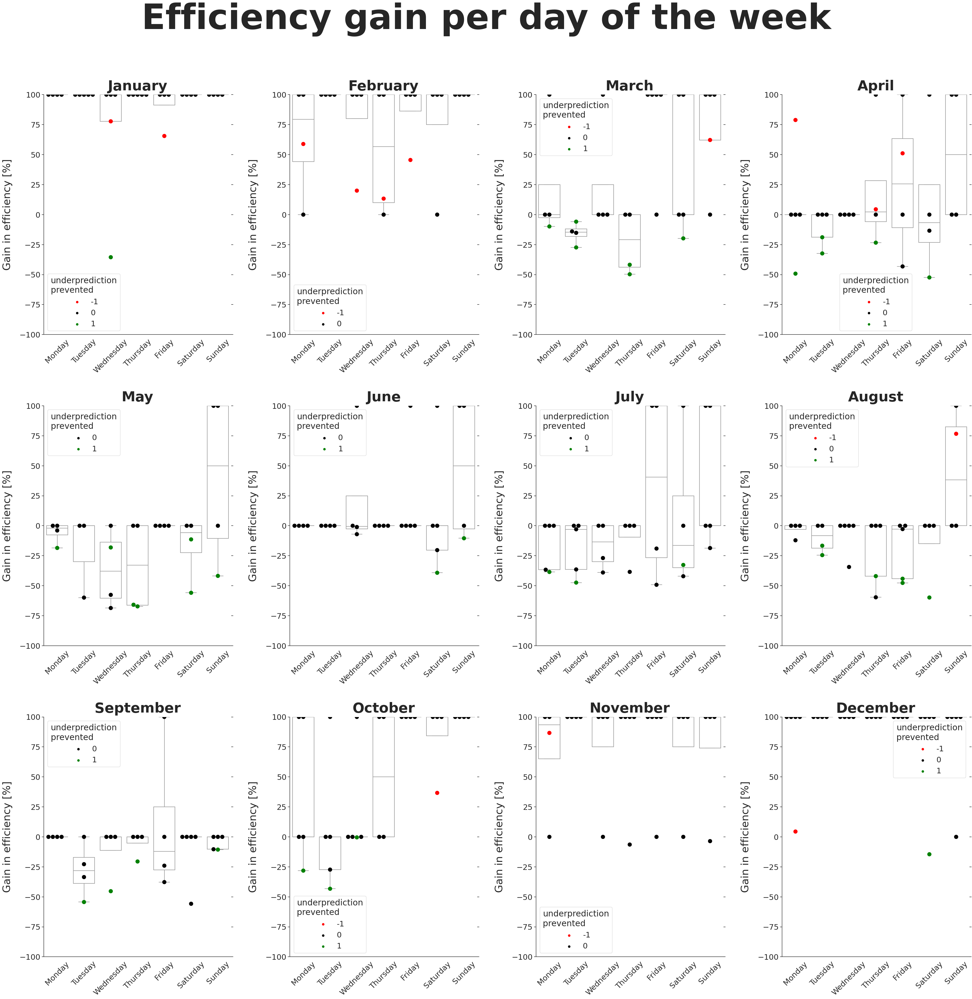

In [34]:
plot_eff_gain_dow(combined_dfs)

As can be seen in the plot, it appears that there is no systematic bias for on which days of the week additional underpredictions happen, suggesting that preferentially setting driver needs to zero during the weekend may not be an issue of the model.
Quite to the contrary, it appears that this strategy is rather fruitful as most of the efficiency gains are made during the weekends.

On the other hand, the model beneficially sacrifices efficiency to prevent underpredictions during the work days.

In the next plot, the business metrics were plotted when all data was aggregated per month.
However, it does not provide any further insights to what has already been discussed above.
Therefore, it will probably not be included in the report.


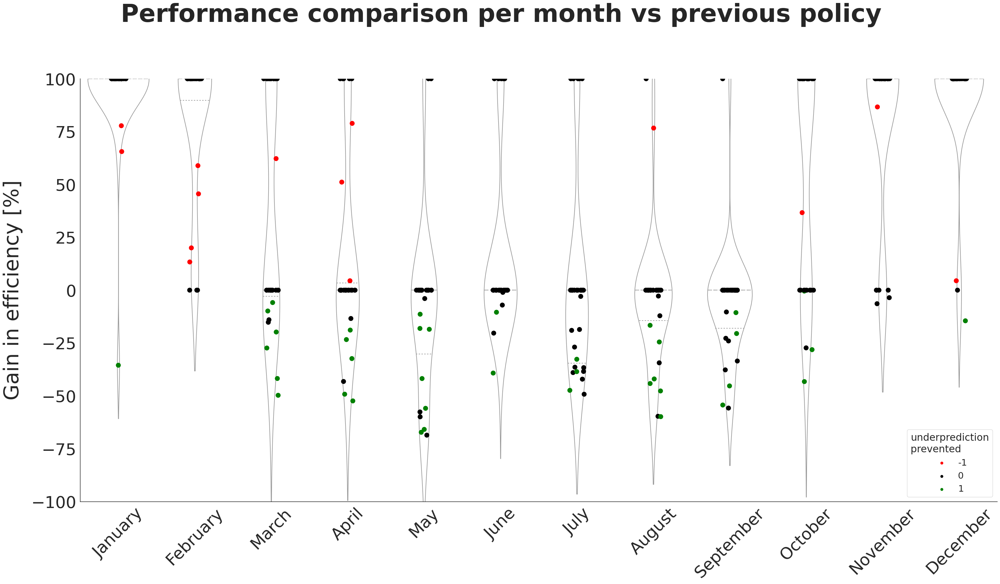

In [35]:
plot_perform_per_month(combined_dfs)


Lastly, the question remained why there were some months during which the model appeared to have performed less optimally than during others.
Specifically, during February, the model's predictions resulted in 4 additional underpredictions which was by far the worst performance in terms of additional underpredictions occurring.

One possible explanation for the degradation in performance could be a potential data drift where the data distribution of the month to be predicted would be substantially different from the past data the model was trained on.

To visually assess a potential data drift, lineplots of each year's driver needs for each month were created. 
Additionally, summary statistics were plotted, such as the count of days with nonzero driver requirements as well as the mean, median and max number of drivers from those events where drivers were greater than zero.


In [36]:

combined_eval_df = combine_and_eval_clf_reg(num_encoded_df, clf_probas, tbats_preds, year_split, interpretable_scores, plotting = True,
                     print_per_month = False, print_mean = False, smoothing = None, decision_thr = 0.15)

As can be seen in the figure, historically, there have never been nonzero driver requirements in the second half of February before 2019.
Furthermore, the number of days on which drivers were required in February had increased substantially in comparison to the past, suggesting that a potential data drift might have occurred. 

To further investigate the potential data drift, KDE and ECDF plots of the nonzero driver needs of each year were created in the following. Moreover, Kolmogorov-Smirnov tests (ks) were performed to formally test for a distribution shift of the most recent year when compared to historical years.



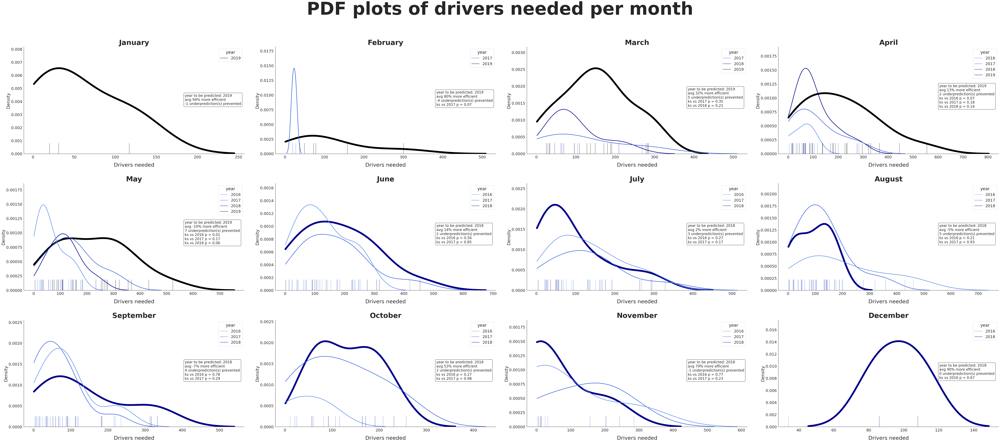

In [37]:
plot_data_distr_per_month(data, combined_dfs, exclude_zeros = True,
                         kind = "PDF", display_ks = True, 
                          display_performance = True, display_pred = False)   

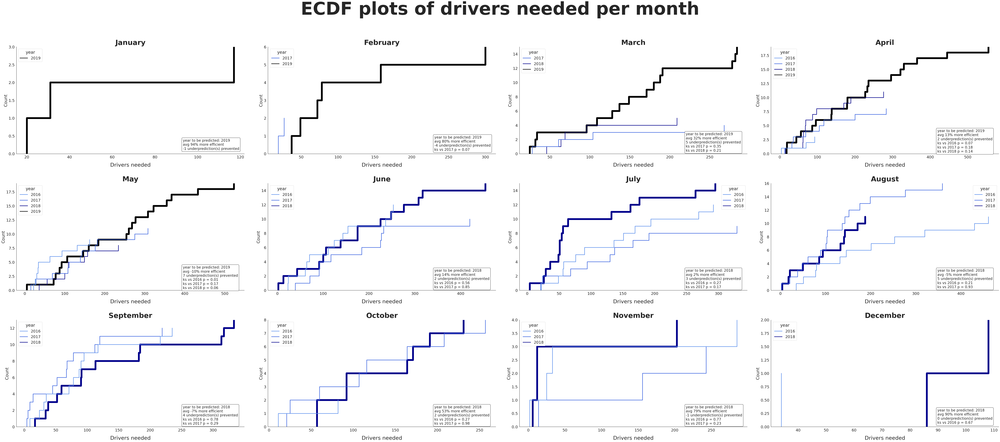

In [38]:
plot_data_distr_per_month(data, combined_dfs, exclude_zeros = True,
                         kind = "ECDF", display_ks = True, 
                          display_performance = True)  

Lines of the year to be predicted are printed in a greater width to facilitate interpretation.

Visual inspection of the above figures rather validates the suspicion that the distribution of nonzero driver requirements of the most recent year is fairly dissimilar compared to the distribution of previous years.

Especially December to February might be of interest as there were only three days with driver demands in total when data from all past years from all those months are summed, indicating how unlikely those events were historically. 
In contrast, in the most recent year alone, the sum of days with nonzero driver requirements over the course of those months is 9, thus being way higher. 

In most past years, no drivers were needed during those months, which is why the ks statistic could not be calculated in those cases unfortunately.

However, for February, the statistic could be calculated for one occasion.
While the test failed to formally prove a distribution shift, the test's result still hints towards a trend for the distribution shift, which might explain the model's drop in performance for this month.

